### Import libraries 

In [3]:
import sys
sys.path.append('stylegan2/')

from stylegan2 import dnnlib
from stylegan2 import legacy


from pathlib import Path
from PIL import Image
import pickle
import numpy as np
import torch
import ipywidgets as widgets
from tqdm import tqdm
import PIL.Image

# Global varibles
model_path = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl'
fps = 20
results_size = 400
device = 'cuda'
torch.cuda.is_available()

True

### Generating a random image of a fake person

In [3]:
# The pretrained model is loaded
def loadGenerator():
    with dnnlib.util.open_url(model_path) as f:
        G = legacy.load_network_pkl(f)['G_ema'].to(device)
    return G

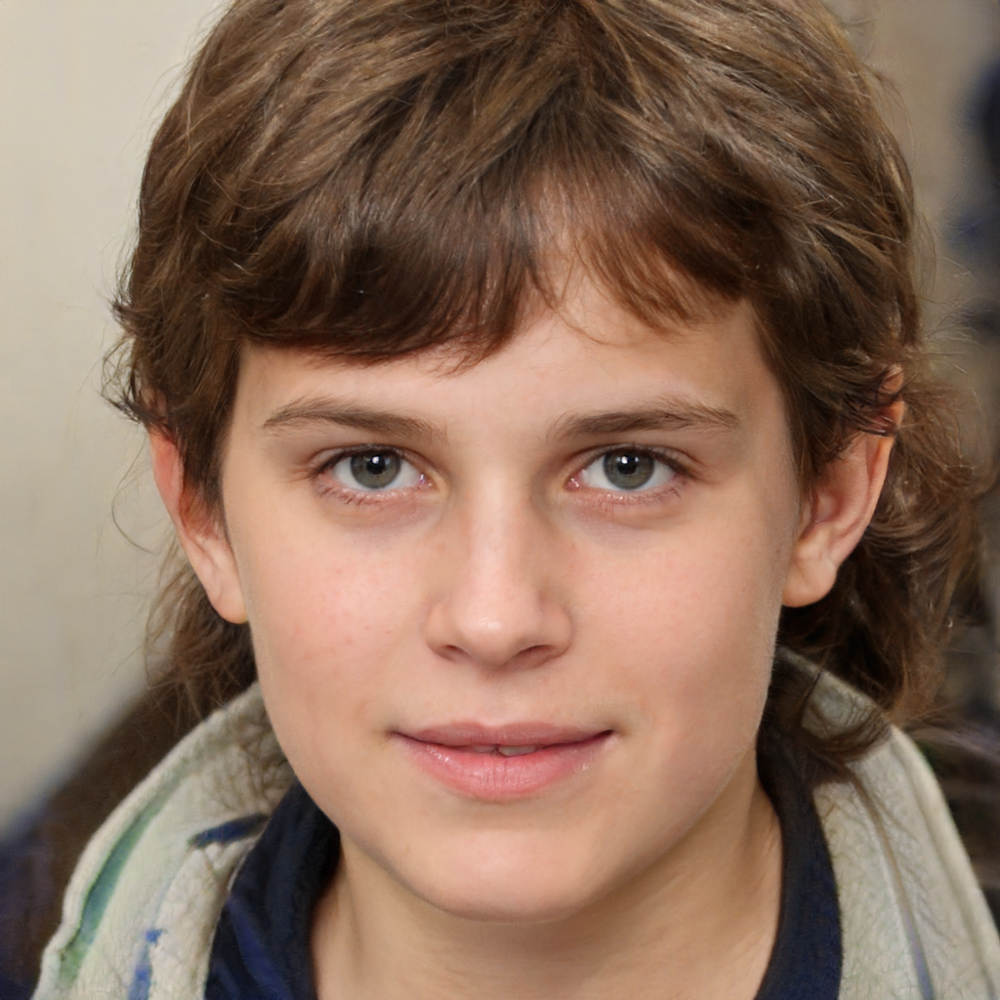

In [16]:
# We use the Generator to create images 
def generate_image(G, z,seed=0):
    torch.manual_seed(seed)
    # If preloaded model suppors classes:
    #   img = G(z, torch.zeros([1, G.c_dim]).to(device), truncation_psi=0.5, noise_mode='const')
    img = G(z, None, truncation_psi=0.5, noise_mode='const')
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB')

#Random noice vector is generated
z = torch.randn(1, 512).to(device)

generate_image(loadGenerator(),z, 31)


### Interpolation of latent Codes

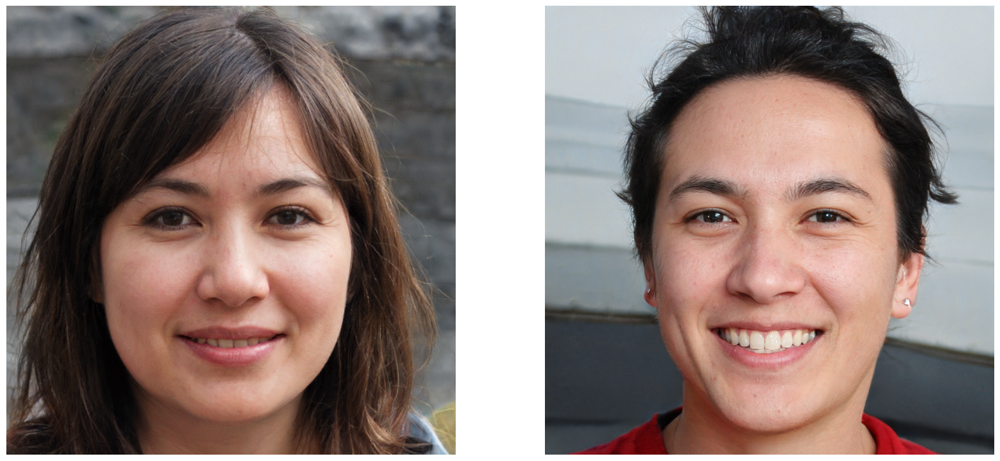

In [17]:
# Libraries for a cool display of results
import matplotlib.animation as animation
import matplotlib.pyplot as plt
from IPython.display import HTML

# Code for linear interpolation
def interpolate(z1, z2, num_steps):
    z_list = []
    for i in range(num_steps):
        alpha = i / num_steps
        z = alpha * z1 + (1 - alpha) * z2
        z_list.append(z)
    return z_list

# Set the seeds
seed1 = 1234
seed2 = 5678

# Generate two consistent random tensors
torch.manual_seed(seed1)
z1 = torch.randn(1, 512).to(device)
torch.manual_seed(seed2)
z2 = torch.randn(1, 512).to(device)

# Generate two images
img1 = generate_image(loadGenerator(), z1)
img2 = generate_image(loadGenerator(), z2)

# Interpolate between the two tensors
num_steps = 20
z_list = interpolate(z1, z2, num_steps)

# Generate an image from each interpolated tensor
img_list = [generate_image(loadGenerator(), z) for z in z_list]


# Create a figure for the original images
fig, axs = plt.subplots(1, 2, figsize=(20,10))

# Display the first image
axs[0].imshow(img1)
axs[0].axis('off')

# Display the second image
axs[1].imshow(img2)
axs[1].axis('off')

plt.show()

# Create a figure
fig = plt.figure(figsize=(5,5))

# Create an image plot
img_plot = plt.imshow(img_list[0])
plt.axis('off')

# Update function for animation
def update(i):
    img_plot.set_data(img_list[i])
    return img_plot,

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(img_list), interval=100, blit=True)

# Clear the figure
plt.close(fig)

# Convert the animation to JavaScript HTML string
ani_jshtml = ani.to_jshtml()

# Display the animation
HTML(ani_jshtml)

### Facial Image Alignment using Landmark Detection
This is a step done to standarize the image to the format of the pretrained model

In [1]:
# from: https://amarsaini.github.io/Epoching-Blog/jupyter/2020/08/10/Latent-Space-Exploration-with-StyleGAN2.html#4.-Facial-Image-Alignment-using-Landmark-Detection
orig_img_path = Path('imgs')
aligned_imgs_path = Path('aligned_imgs')

# Make Aligned Images folder if it doesn't exist.
if not aligned_imgs_path.exists():
    aligned_imgs_path.mkdir()
    
orig_img_path, aligned_imgs_path

if not Path('shape_predictor_68_face_landmarks.dat').exists():
    !wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
    !bzip2 -dv shape_predictor_68_face_landmarks.dat.bz2
from align_face import align_face

# Align all of our images using a landmark detection model!
all_imgs = list(orig_img_path.iterdir())
for img in all_imgs:
    align_face(str(img)).save(aligned_imgs_path/('aligned_'+img.name))

NameError: name 'Path' is not defined

### Projecting our own Input Images into the Latent Space

In [ ]:
# Create styleGAN2 dataset
!python -W ignore stylegan2/dataset_tool.py --source aligned_imgs --dest dataset

In [ ]:
# Project the dataset images into the latent space 
# (saving video does not works and will void the entire process)
# Just saves 1 image in a folder per exec, a modification to the projector is needed for large datasets
!python stylegan2/projector.py --outdir=out2 --target=dataset/00000/img00000001.png --network=$model_path \
  --num-steps=500 --save-video= False

In [4]:
# Checking how much cuda memory is left
# If free < 2Gb restart kernel and reload libraries && generator 
t = torch.cuda.get_device_properties(0).total_memory
r = torch.cuda.memory_reserved(0)
a = torch.cuda.memory_allocated(0)
f = r-a  # free inside reserved\
from pynvml import *
nvmlInit()
h = nvmlDeviceGetHandleByIndex(0)
info = nvmlDeviceGetMemoryInfo(h)
print(f'total    : {info.total}')
print(f'free     : {info.free}')
print(f'used     : {info.used}')


# Generate a image from the projected_w.npz
projected_w_np = np.load('out2/projected_w.npz')['w']
projected_w = torch.tensor(projected_w_np, device=device)

def generate_image_from_w(G, w):
    img = G.synthesis(w.unsqueeze(0), noise_mode='const')
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB')

generate_image_from_w(loadGenerator(), projected_w[0])

total    : 6442450944
free     : 5301010432
used     : 1141440512


NameError: name 'loadGenerator' is not defined

In [5]:
# Load direction vectors
def get_control_latent_vectors(path):
    files = [x for x in Path(path).iterdir() if str(x).endswith('.npy')]
    latent_vectors = {f.name[:-4]:np.load(f) for f in files}
    return latent_vectors
latent_controls = get_control_latent_vectors('stylegan2directions/')
len(latent_controls), latent_controls.keys(), latent_controls['age'].shape

(16,
 dict_keys(['mouth_open', 'pitch', 'lip_ratio', 'yaw', 'nose_mouth_distance', 'age', 'eyes_open', 'smile', 'mouth_ratio', 'nose_tip', 'nose_ratio', 'eye_eyebrow_distance', 'eye_ratio', 'eye_distance', 'gender', 'roll']),
 (18, 512))

### Latent Directions/Controls to modify our projected images

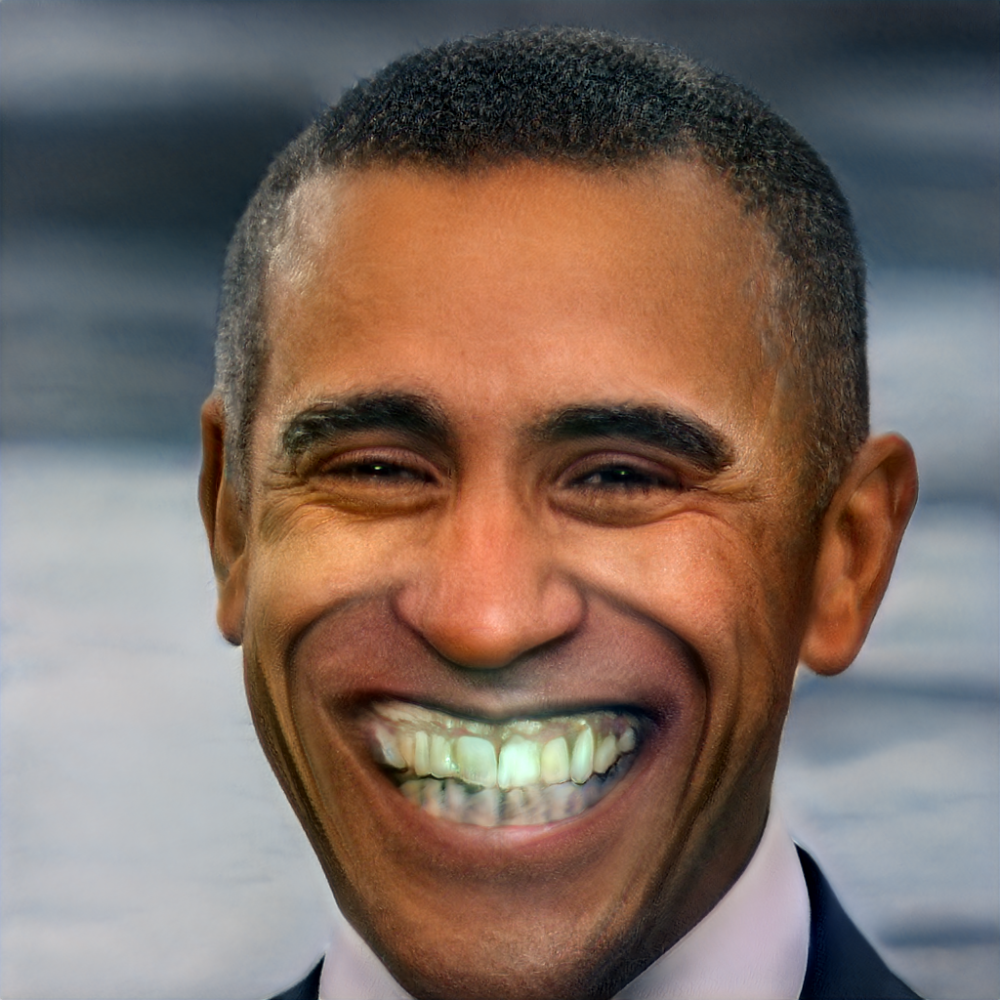

In [9]:
# Apply latent controls to a latent vector to change the image in a specific way
def apply_latent_controls(latent_vector, controls, strength=1):
    new_latent_vector = latent_vector.copy()
    
    new_latent_vector += controls * strength
    return new_latent_vector
# The last number is the strength of the control -inf to inf (beware large values)
# Change the value of the dictionary key to apply a different control
z = apply_latent_controls(projected_w[0].cpu().numpy(), latent_controls['smile'], 10)
generate_image_from_w(loadGenerator(), torch.tensor(z, device=device))
